# Businuss Case
Create a model which can classify the three major attacking diseases of rice plants like leaf blast, bacterial blight and brown spot.

In [1]:
import numpy as np                  # Import numpy for numerical operations (arrays, math, linear algebra)
import pandas as pd                 # Import pandas for data handling (tables, dataframes, CSV, Excel, etc.)
import seaborn as sns               # Import seaborn for easy and beautiful data visualizations
import matplotlib.pyplot as plt     # Import matplotlib for creating charts and plots
import tensorflow as tf             # Import tensorflow for de ep learning and machine learning tasks
import keras                        # Import keras for  High-level deep learning API (built on top of TensorFlow)
import warnings                     # To manage warning messages
warnings.filterwarnings("ignore")   # Ignore warnings to keep the output clean

In [2]:
input_shape_2D=(224,224)      # Imgae width and height only
input_shape_3D= (224,224,3)   # image width, height and 3 colour channels(rgb)
seed=1                       # Fix random results (for consistency)
batch_size=32                # Train 32 images at once (in one step)
epochs=30                   # Go through the whole dataset 30 times

In [3]:
data_ds= tf.keras.utils.image_dataset_from_directory(
    directory=r"C:\Users\lenovo\Desktop\RICE-LEAF\LEAF-PICTURE", # Folder path where images are stored
    labels="inferred", # Automatically assign labels from subfolder names
    label_mode="int",  # Labels will be integers 
    class_names=None,  # If none, class names are taken from folder names
    color_mode="rgb",  # Load images in RGB format 
    batch_size=None,  # no batching  
    image_size=input_shape_2D, # Resize all images to (224,224)
    seed=seed      # Keep results consistent
)

Found 119 files belonging to 3 classes.


In [4]:
class_names = data_ds.class_names # get the list of class names from the dataset
print("Class Names:", class_namesubs) # print all class names

Class Names: ['Bacterial leaf blight', 'Brown spot', 'Leaf smut']


In [5]:
def show_images(images, labels):
    fig, axes = plt.subplots(8, 4, figsize=(10, 10)) # Create a grid of 8 rows x 4 columns for showing image
    axes = axes.flatten() # Flatten axes array fro eassy indexing
    for i, (img, label) in enumerate(zip(images, labels)): # loop through images and labels together 
        axes[i].imshow(img.numpy().astype("uint8")) # Show the image
        axes[i].set_title(f"Label: {label}") # Show class name instead of number
        axes[i].axis("off") # Hide axis lines aqnd ticks 
    plt.tight_layout() # adjust spacing to avoid overlap
    plt.show() # Display the grid of images 

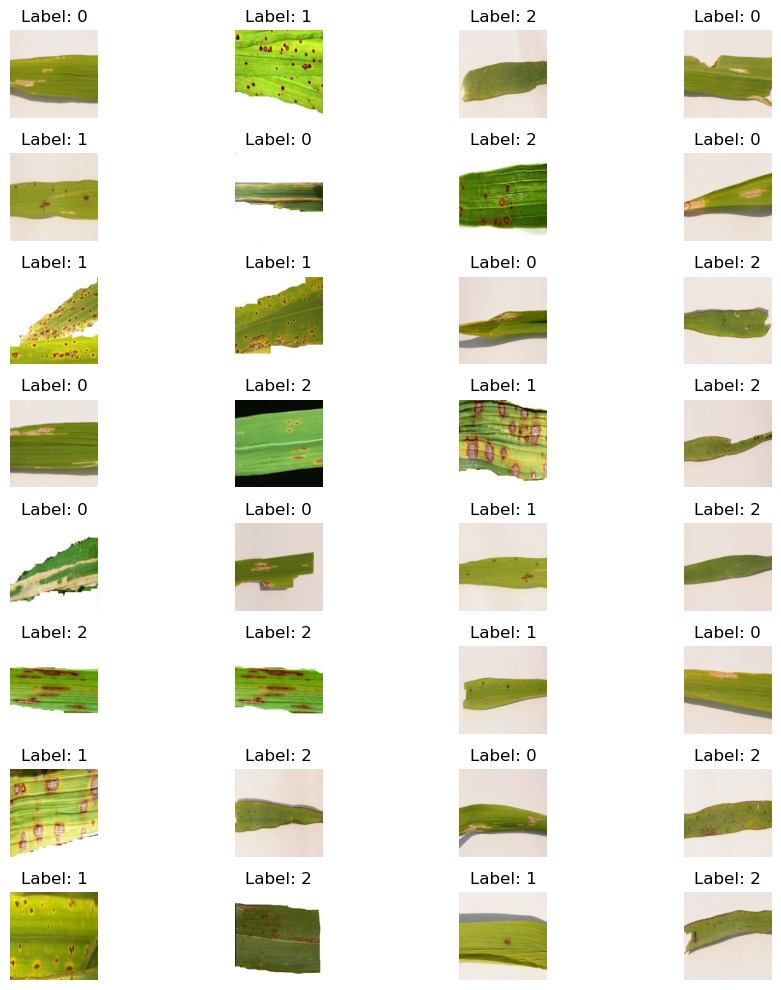

In [6]:
batched_ds = data_ds.batch(batch_size)  # Group dataset into batches of 32 images
batch = next(iter(batched_ds))   # Get the first batch (images + labels)
images, labels = batch   # Split batch into images and their labels  
images, labels = next(iter(batched_ds)) # Again take the next batch of images and labels
show_images(images, labels) # Show these images with their labels

In [7]:
# data preprocessing 
X=[] # empty list to store images
y= [] # empty list to store labels
for image, labels in data_ds.batch(120):  # Loop through dataset in batches of 120 images
  for img, labels in zip(image, labels):  # loop through each image and itss label in the batch 
    X.append(img)    # Add image to X list 
    y.append(labels.numpy())  # conbvert label to numpy(int) and add to y list

In [8]:
print(image.shape) # show the shape of the current image batch (batch_size, height, width, channels)

(119, 224, 224, 3)


In [9]:
X= np.array(X) # Convert list of images into a NumPy array (shape: num_images, 224, 224, 3)
y= np.array(y) # Convert list of labels into a NumPy array (shape: num_images)

In [10]:
(X_train,X_test) = X[0:100],X[100:] # First 100 images go to training, the rest go to testing
(y_train,y_test) = y[0:100],y[100:]  # First 100 labels for training, the rest for testing

In [11]:
X_train # Images used for training the model

array([[[[  4.761161 ,   9.761161 ,   3.7611609],
         [  5.566964 ,   9.716518 ,   4.       ],
         [  9.417412 ,  10.611608 ,   5.6116076],
         ...,
         [  6.       ,  11.       ,   5.       ],
         [  8.       ,  10.       ,   5.       ],
         [  8.       ,  10.       ,   5.       ]],

        [[  4.761161 ,   9.761161 ,   3.7611609],
         [  5.566964 ,   9.716518 ,   4.       ],
         [  9.417412 ,  10.611608 ,   5.6116076],
         ...,
         [  6.       ,  11.       ,   5.       ],
         [  8.       ,  10.       ,   5.       ],
         [  8.       ,  10.       ,   5.       ]],

        [[  4.761161 ,   9.761161 ,   3.7611609],
         [  5.566964 ,   9.716518 ,   4.       ],
         [  9.417412 ,  10.611608 ,   5.6116076],
         ...,
         [  6.       ,  11.       ,   5.       ],
         [  8.       ,  10.       ,   5.       ],
         [  8.       ,  10.       ,   5.       ]],

        ...,

        [[ 10.238839 ,  11.238839 ,   

In [12]:
X_train = X_train.astype('float32')/255 # change training images to float values (0-1 range instead of 0-255)
X_test = X_test.astype('float32')/255  # change testing images to float values (0-1 range instead of 0-255)

In [13]:
print("shape of X_train_scaled:", X_train.shape) # Show size of training images 
print("shape of y_train:", y_train.shape)        # Show size of training labels
print("shape of X_test_scaled:", X_test.shape)   # Show size of testing images
print("shape of y_test:", y_test.shape)          # Show size of testing labels

shape of X_train_scaled: (100, 224, 224, 3)
shape of y_train: (100,)
shape of X_test_scaled: (19, 224, 224, 3)
shape of y_test: (19,)


In [14]:
from tensorflow.keras import utils    # Import keras utility functions
from tensorflow.keras.utils import to_categorical # Import function to convert labels to one-hot encoding

y_train = to_categorical(y_train, num_classes=len(class_names)) # Convert training labels into one-hot format
y_test = to_categorical(y_test, num_classes=len(class_names))   # Convert testing labels into one-hot format

In [15]:
print(X_train.shape[0],"train sample") # Print how many training images are available
print(X_test.shape[0],"test sample")   # Print how many testing images are available

100 train sample
19 test sample


In [16]:
# Build a CNN model with multiple Conv2D + MaxPooling layers for feature extraction, Dropout for regularization, Flatten + Dense layers for classification, and final softmax output for 3 classes.
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,Flatten,Dense,Dropout
model = Sequential()
model.add(Conv2D(filters=16,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros',input_shape=(224,224,3)))
model.add(MaxPooling2D(pool_size=3))
model.add(Conv2D(filters=32,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=3))
model.add(Conv2D(filters=64,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=3))
model.add(Conv2D(filters=128,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=256,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.3))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(250,activation='relu'))
model.add(Dense(100,activation='relu'))
model.add(Dense(3,activation='softmax'))
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 16)        │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 74, 74, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 74, 74, 32)          │           4,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 24, 24, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 24, 24, 64)          │          18,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 128)           │          73,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 4, 4, 256)           │         294,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 2, 2, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2, 2, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 250)                 │         256,250 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 100)                 │          25,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 3)                   │             303 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 673,765 (2.57 MB)

 Trainable params: 673,765 (2.57 MB)

 Non-trainable params: 0 (0.00 B)

In [17]:
# Prepare the model: use categorical_crossentropy for multi-class labels, Adam to optimize learning, and track accuracy as performance
model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

In [18]:
# Import ModelCheckpoint for saving models during training
from keras.callbacks import ModelCheckpoint 
checkpointer = ModelCheckpoint(filepath="model_best.keras",save_best_only=False,mode=max,monitor="val_accuracy")

In [19]:
# Set number of epochs (how many times the model will see the full training data)
epoch = 63 
history = model.fit(X_train,y_train,batch_size=32,epochs=epoch,validation_data=(X_test,y_test),callbacks=[checkpointer],
              verbose=1,shuffle=True)

Epoch 1/63
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 696ms/step - accuracy: 0.2800 - loss: 1.1327 - val_accuracy: 0.2105 - val_loss: 1.1156
Epoch 2/63
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 441ms/step - accuracy: 0.3600 - loss: 1.1020 - val_accuracy: 0.2105 - val_loss: 1.1501
Epoch 3/63
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 437ms/step - accuracy: 0.3600 - loss: 1.0935 - val_accuracy: 0.2105 - val_loss: 1.1266
Epoch 4/63
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 449ms/step - accuracy: 0.3800 - loss: 1.0855 - val_accuracy: 0.2105 - val_loss: 1.1067
Epoch 5/63
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 407ms/step - accuracy: 0.3800 - loss: 1.0805 - val_accuracy: 0.2105 - val_loss: 1.1453
Epoch 6/63
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 550ms/step - accuracy: 0.3500 - loss: 1.1086 - val_accuracy: 0.2105 - val_loss: 1.1299
Epoch 7/63
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 406ms/step - accuracy: 0.3800 - loss: 1.0811 - val_accuracy: 0.6316 - val_loss: 1.0832
Epoch 8/63
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 397ms/step - accuracy: 0.3600 - loss: 1.0910 - val_accuracy: 0.4737 - val_loss:

In [20]:
# Make predictions on the test data
y_hat = model.predict(X_test) # Use the trained model to predict labels for test data
leaf_class = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut'] # Names of the target classes

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 978ms/step


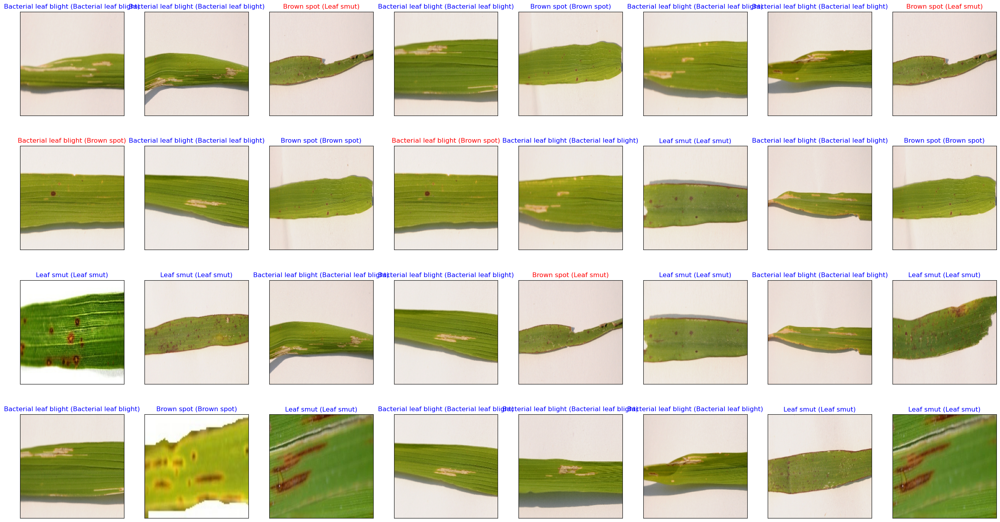

In [21]:
fig = plt.figure(figsize=(32, 17)) # Create a figure of size 32x17 to display images
for i, idx in enumerate(np.random.choice(X_test.shape[0], size=32, replace=True)): # Randomly select 32 test images (with replacement) and loop through them
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[]) # Add each image into a 4x8 grid (32 slots total), hide axis ticks
    ax.imshow(np.squeeze(X_test[idx])) # Show the selected test image
    pred_idx = np.argmax(y_hat[idx])   # Get predicted class (index of highest probability)
    true_idx = np.argmax(y_test[idx])  # Get actual class (index from true labels)
    ax.set_title("{} ({})".format(leaf_class[pred_idx], leaf_class[true_idx]),color=("blue" if pred_idx == true_idx else "red"))
    # Title shows: predicted class (true class)
    # Title color → Blue if correct, Red if wrong

In [22]:
scores = model.evaluate(X_test, y_test)   # Test the model on unseen data (gives loss and accuracy)
accuracys = 100*scores[1]                  # Take accuracy value and convert it to percentage
print('Test accuracy: %.4f%%' % accuracys) # Show the test accuracy up to 4 decimal places

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - accuracy: 0.8947 - loss: 0.5434
Test accuracy: 89.4737%


In [23]:
accuracys # Test accuracy in percentage

89.47368264198303

In [24]:
leaf_class[np.argmax(scores)] # Returns a class name using max value index from scores

'Brown spot'

In [25]:
history.history.keys() # Lists the names of metrics and loss tracked during training

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

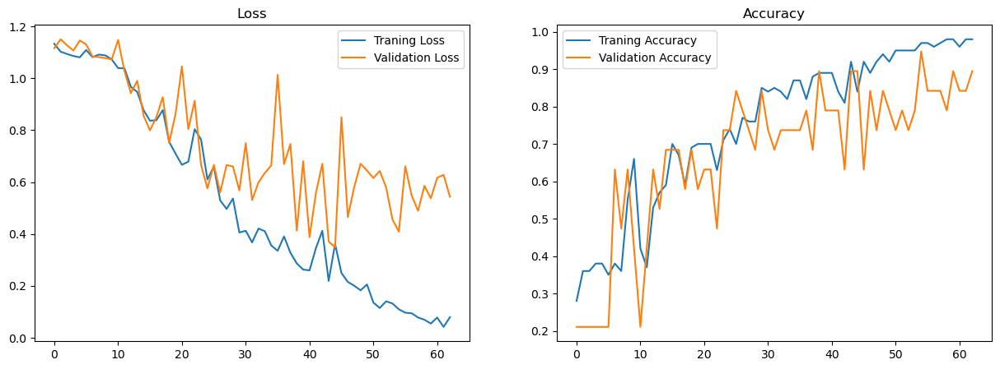

In [26]:
loss = history.history["loss"]               # Training loss values
val_loss = history.history["val_loss"]       # Validation loss values
accuracy = history.history["accuracy"]       # Training accuracy values
val_accuracy = history.history["val_accuracy"] # Validation accuracy values
plt.figure(figsize=(15,5)) # Create a wide figure for 2 plots
plt.subplot(1,2,1)  # Left plot
plt.plot(range(epoch),loss,label="Traning Loss") # Plot training loss
plt.plot(range(epoch),val_loss,label="Validation Loss") # Plot validation loss
plt.title("Loss") # Title for loss plot
plt.legend()  # Show curve labels
plt.subplot(1,2,2) # Right plot
plt.plot(range(epoch),accuracy,label="Traning Accuracy") # Plot training accuracy
plt.plot(range(epoch),val_accuracy,label="Validation Accuracy") # Plot validation accuracy
plt.title("Accuracy") # Title for accuracy plot
plt.legend() # Show curve labels

## Data Augmentation 

In [27]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator # Import class to generate and augment image data

In [28]:
datagen = ImageDataGenerator(  # Create an image data generator with augmentation options
    shear_range = 0.3,         # Randomly slants the image up to 0.3 angle
    zoom_range = 0.3,          # Randomly zooms in/out by 30%
    width_shift_range=0.4,     # Shifts the image horizontally (40% of width)
    height_shift_range=0.4,    # Shifts the image vertically (40% of height)
    fill_mode='nearest',      # Fills empty pixels after transformation with nearest values
    horizontal_flip=True,     # Randomly flips images left-right
    vertical_flip=True,)     # Randomly flips images up-down

In [29]:
# Build a CNN (Convolutional Neural Network) using Sequential model with multiple Conv, Pooling, Dropout, and Dense layers.  
# The final Dense layer has 3 outputs with softmax activation for multi-class classification. 
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,Flatten,Dense,Dropout


model1 = Sequential()
model1.add(Conv2D(filters=16,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros',input_shape=(224,224,3)))
model1.add(MaxPooling2D(pool_size=3))
model1.add(Conv2D(filters=32,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model1.add(MaxPooling2D(pool_size=3))
model1.add(Conv2D(filters=64,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model1.add(MaxPooling2D(pool_size=3))
model1.add(Conv2D(filters=128,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model1.add(MaxPooling2D(pool_size=2))
model1.add(Conv2D(filters=256,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model1.add(MaxPooling2D(pool_size=2))
model1.add(Dropout(0.16))
model1.add(Flatten())
model1.add(Dropout(0.27))
model1.add(Dense(500,activation='relu'))
model1.add(Dense(100,activation='relu'))
model1.add(Dense(3,activation='softmax'))


model1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 224, 224, 16)        │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 74, 74, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 74, 74, 32)          │           4,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 24, 24, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 24, 24, 64)          │          18,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 8, 8, 128)           │          73,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 4, 4, 256)           │         294,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 2, 2, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 2, 2, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 500)                 │         512,500 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 100)                 │          50,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 3)                   │             303 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 955,015 (3.64 MB)

 Trainable params: 955,015 (3.64 MB)

 Non-trainable params: 0 (0.00 B)

In [30]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy evaluation 
model1.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

In [31]:
epoch1 = 63 # epochs count


checkpointer_own_aug = ModelCheckpoint(filepath="model_best.keras", verbose=6,monitor="val_accuracy",) # save best model

aug_history= model1.fit(
    datagen.flow(X_train, y_train, batch_size=32), # augmented train data
    validation_data=(X_test, y_test),    # validation set
    steps_per_epoch=len(X_train)//batch_size,  # steps per epoch
    epochs=epoch1, # training epochs
    shuffle=True, # shuffle data  
    callbacks=[checkpointer_own_aug] # checkpoint callback 
)

Epoch 1/63
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2832 - loss: 1.1158   
Epoch 1: saving model to model_best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 29s 4s/step - accuracy: 0.2941 - loss: 1.1542 - val_accuracy: 0.3684 - val_loss: 1.0966
Epoch 2/63
1/3 ━━━━━━━━━━━━━━━━━━━━ 1s 733ms/step - accuracy: 0.1875 - loss: 1.1638
Epoch 2: saving model to model_best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 554ms/step - accuracy: 0.1875 - loss: 1.1638 - val_accuracy: 0.3684 - val_loss: 1.0922
Epoch 3/63
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3526 - loss: 1.0953
Epoch 3: saving model to model_best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.3235 - loss: 1.0979 - val_accuracy: 0.4211 - val_loss: 1.0954
Epoch 4/63
1/3 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.2188 - loss: 1.0986
Epoch 4: saving model to model_best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 395ms/step - accuracy: 0.2188 - loss: 1.0986 - val_accuracy: 0.2105 - val_loss: 1.0987
Epoch 5/63
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step 

In [32]:
y_hat = model1.predict(X_test) # Predictions on test data

leaf_class = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut'] # Class labels 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


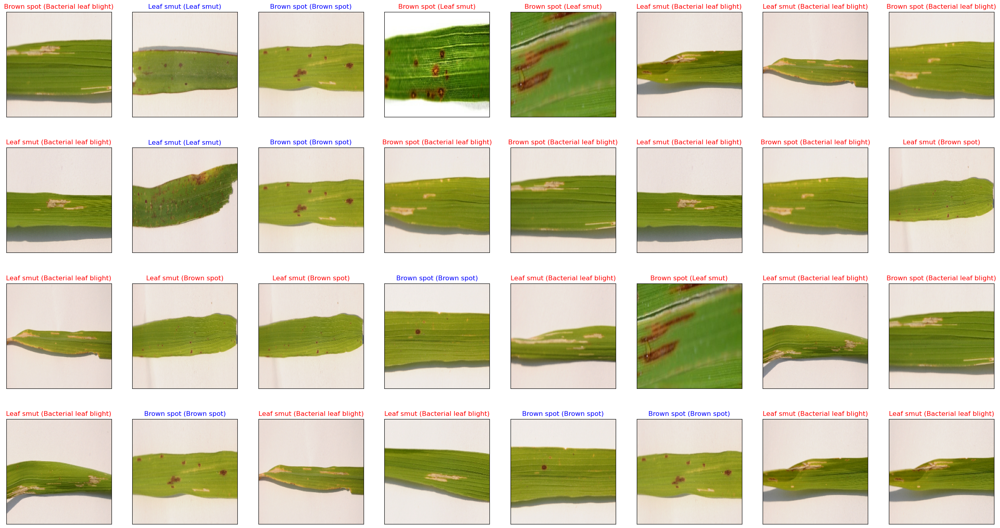

In [33]:
fig = plt.figure(figsize=(32, 17))  # Create figure
for i, idx in enumerate(np.random.choice(X_test.shape[0], size=32, replace=True)): # Select 32 random images
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[]) # Add subplot in 4x8 grid
    ax.imshow(np.squeeze(X_test[idx])) # Show test image 
    pred_idx = np.argmax(y_hat[idx]) # Predicted class index
    true_idx = np.argmax(y_test[idx]) # Actual class index
    ax.set_title("{} ({})".format(leaf_class[pred_idx], leaf_class[true_idx]), # Show prediction (actual) 
                 color=("blue" if pred_idx == true_idx else "red")) # Blue=correct, Red=wrong

In [34]:
score1 = model1.evaluate(X_test, y_test)  # predicting the model
accuracy_1 = 100*score1[1] # saving the accuracy in variable
print('Test accuracy: %.4f%%' % accuracy_1) # print test accuracy

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - accuracy: 0.4211 - loss: 1.0192
Test accuracy: 42.1053%


In [35]:
def plot_performance(model_name, acc, val_acc, loss, val_loss): # Function to plot training vs validation performance
  plt.figure(figsize=(10,5)) # Create figure of size 10x5
  plt.subplot(1,2,1) # First subplot for loss
  plt.plot(loss) # Plot training loss
  plt.plot(val_loss) # Plot validation loss
  plt.title('{} : Loss'.format(model_name), fontsize=12, fontweight='bold') # Title with model name
  plt.ylabel('Loss') # Y-axis label
  plt.xlabel('Epoch') # X-axis label
  plt.legend(['train', 'test'], loc='upper right') # Add legend (train/test)
  plt.subplot(1,2,2) # Second subplot for accuracy
  plt.plot(acc) # Plot training accurac
  plt.plot(val_acc) # Plot validation accuracy
  plt.title('{} : Accuracy'.format(model_name), fontsize=12, fontweight='bold') # Title with model name
  plt.ylabel('Accuracy') # Y-axis label
  plt.xlabel('Epoch') # X-axis label
  plt.legend(['train', 'test'], loc='upper right') # Add legend (train/test)
  plt.tight_layout() # Adjust layout to avoid overlap

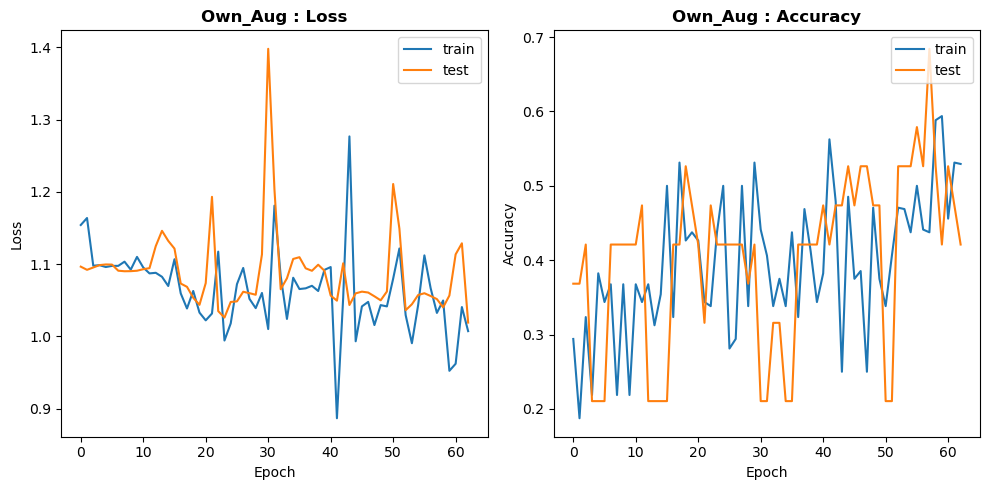

In [36]:
plot_performance(model_name='Own_Aug', # Plot for Own_Aug
                  acc=aug_history.history['accuracy'], # Train accuracy
                 val_acc=aug_history.history['val_accuracy'], # Val accuracy
                 loss=aug_history.history['loss'], # Train loss  # Val loss
                 val_loss=aug_history.history['val_loss']) # Val loss

# Keras Tuner 

In [37]:
import keras_tuner # Library for hyperparameter tuning
from keras_tuner import RandomSearch  # Tool to find best hyperparameters randomly
from keras_tuner.engine.hyperparameters import HyperParameters # Used to define hyperparameters for tuning

In [38]:
def build_model(hp):
    new_model = Sequential() # Start a Sequential model
    # 1st Conv layer with tunable filters, kernel size, padding
    new_model.add(Conv2D(
        filters=hp.Int('conv_1_filter', min_value=8, max_value=32, step=8),
        kernel_size=hp.Choice('conv_1_kernel', values=[2, 3]),
        padding=hp.Choice('conv_1_pad', values=['same', 'valid']),
        activation='relu', input_shape=input_shape_3D))
    new_model.add(MaxPooling2D())
    # 2nd Conv layer with tunable filters, kernel size, padding
    new_model.add(Conv2D(
        filters=hp.Int('conv_2_filter', min_value=16, max_value=64, step=16),
        kernel_size=hp.Choice('conv_2_kernel', values=[2, 3]),
        padding=hp.Choice('conv_2_pad', values=['same', 'valid']),
        activation='relu'))
    new_model.add(MaxPooling2D())
    # 3rd Conv layer with tunable filters, kernel size, padding
    new_model.add(Conv2D(
        filters=hp.Int('conv_3_filter', min_value=32, max_value=64, step=16),
        kernel_size=hp.Choice('conv_3_kernel', values=[2, 3]),
        padding=hp.Choice('conv_3_pad', values=['same', 'valid']),
        activation='relu'))
    new_model.add(MaxPooling2D())  # Reduce size using pooling
    new_model.add(Flatten()) # Flatten feature maps into a vector
     # Dense layer with tunable number of neurons
    new_model.add(Dense(
        units=hp.Int('dense_1_units', min_value=50, max_value=250, step=50),
        activation='relu'))
    new_model.add(Dense(3, activation='softmax')) # Output layer (3 classes)
    # Compile model with tunable learning rate
    new_model.compile(
        optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-3])),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return new_model


In [39]:
# Runs random search to tune hyperparameters and improve model accuracy 
tuner_search=RandomSearch(build_model, objective='val_accuracy', max_trials=3, directory='output', project_name='RiceLeafDisease')

Reloading Tuner from output\RiceLeafDisease\tuner0.json


In [40]:
tuner_search.search(
    datagen.flow(X_train, y_train), # Feed augmented training images to the tuner
    validation_data=(X_test, y_test),  # Evaluate performance on test images
    epochs=10 # Run each trial for 10 epochs
)

In [41]:
tuned_model=tuner_search.get_best_models(num_models=1)[0] # Get the best model found by the tuner

In [42]:
tuned_model.summary() # Show a summary of the best model found by the tuner

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 223, 223, 8)         │             104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 8)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 111, 111, 48)        │           1,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 55, 55, 48)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 54, 54, 64)          │          12,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 27, 27, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 46656)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 150)                 │       6,998,550 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 3)                   │             453 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,013,043 (26.75 MB)

 Trainable params: 7,013,043 (26.75 MB)

 Non-trainable params: 0 (0.00 B)

In [43]:
# Create a checkpoint to save the best model during training
checkpointer_own_tuned = ModelCheckpoint(filepath="model_best.keras", verbose=3, save_best_only=True)
# Train the best tuned model using augmented data
tuned_history= tuned_model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size), # Generate augmented training data in batches
    validation_data=(X_test, y_test),                      # Use test data for validation
    steps_per_epoch=len(X_train)//batch_size,              # Number of steps per epoch
    initial_epoch=10,                                      # Start training from epoch 10
    epochs=epochs,                                         # Total number of epochs to train
    callbacks=[checkpointer_own_tuned])                    # Use the checkpoint callback to save best model

Epoch 11/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4717 - loss: 1.0123   
Epoch 11: val_loss improved from None to 1.01077, saving model to model_best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 3s/step - accuracy: 0.4118 - loss: 1.0394 - val_accuracy: 0.4737 - val_loss: 1.0108
Epoch 12/30
1/3 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.5000 - loss: 0.9603
Epoch 12: val_loss improved from 1.01077 to 0.96507, saving model to model_best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.5000 - loss: 0.9603 - val_accuracy: 0.5263 - val_loss: 0.9651
Epoch 13/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.3339 - loss: 1.1373      
Epoch 13: val_loss did not improve from 0.96507
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 4s/step - accuracy: 0.5294 - loss: 1.0442 - val_accuracy: 0.7895 - val_loss: 0.9812
Epoch 14/30
1/3 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.5625 - loss: 1.0143
Epoch 14: val_loss did not improve from 0.96507
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step - accuracy: 0.5625 - l

In [44]:
y_hat1 = tuned_model.predict(X_test) # Model predictions
leaf_class = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut'] # Leaf categories


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


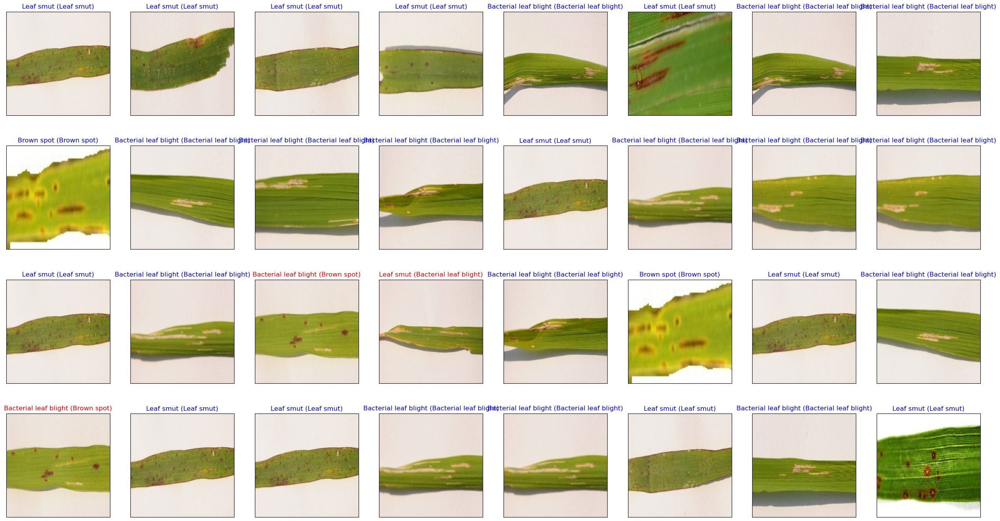

In [45]:
fig = plt.figure(figsize=(32, 17)) # create figure
for i, idx in enumerate(np.random.choice(X_test.shape[0], size=32, replace=True)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[]) # add subplot
    ax.imshow(np.squeeze(X_test[idx])) # show image
    pred_idx = np.argmax(y_hat1[idx])  # predicted index
    true_idx = np.argmax(y_test[idx])  # true index
    ax.set_title("{} ({})".format(leaf_class[pred_idx], leaf_class[true_idx]),
                 color=("blue" if pred_idx == true_idx else "red")) # set title

In [46]:
score2 = tuned_model.evaluate(X_test, y_test) # evaluate model
accuracy_2 = 100*score2[1]                     # calculate accuracy
print('Test accuracy: %.4f%%' % accuracy_2)    # print accuracy

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step - accuracy: 0.7895 - loss: 0.6453
Test accuracy: 78.9474%


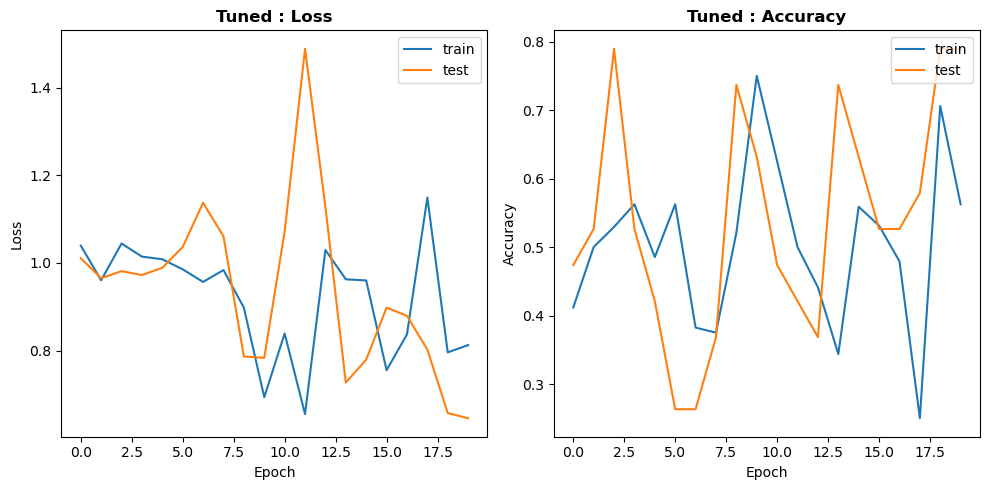

In [47]:
# plot training & validation curves
plot_performance(model_name='Tuned',         # model name                     
                    acc=tuned_history.history['accuracy'],      # training accuracy     
                  val_acc=tuned_history.history['val_accuracy'],   # validation accuracy
                 loss=tuned_history.history['loss'],  # training loss
                  val_loss=tuned_history.history['val_loss']) # validation loss

In [48]:
 # create DataFrame to compare models
score = pd.DataFrame({"Model":["Normal CNN","Data Augmentation","CNN with hyperparameter"], # model names
                     "Accuracy":[accuracys,accuracy_1,accuracy_2] # their accuracies
                     })

In [49]:
score # display the DataFrame showing model names and their accuracies

,Model,Accuracy
0,Normal CNN,89.473683
1,Data Augmentation,42.105263
2,CNN with hyperparameter,78.947371


# Conclusion

___This project successfully demonstrated the development of a rice leaf disease detection system using CNN models in TensorFlow/Keras. 
Despite challenges in dataset handling, preprocessing, and training optimization, the model was able to classify leaf images with reasonable accuracy.___

# CHALLENGES

## Challenges Faced
1. **Dataset Handling**  
   - Initially faced issues with loading images from directory due to folder structure mismatch.  
   - Large image sizes required resizing (224×224) for training compatibility.  
   - Dataset imbalance between classes led to potential bias in predictions.

2. **Preprocessing & Normalization**  
   - Converting images into arrays and scaling them to the right range (`0–1`) was necessary to improve training speed and stability.  
   - Data augmentation was needed to avoid overfitting, as raw images alone were insufficient.

3. **Model Training**  
   - GPU/CPU limitations made training deep models (CNN with Keras/TensorFlow) slow.  
   - Choosing the right batch size and epochs was challenging; too small batch size caused slow convergence, while too large batch size caused memory issues.  
   - Overfitting occurred after certain epochs, requiring dropout layers and early stopping.

4. **Evaluation & Accuracy**  
   - The model performed well on training data but struggled with unseen test data.  
   - Hyperparameter tuning (learning rate, optimizer selection, number of layers) was time-consuming and required multiple experiments.  
   - Visualizing results with confusion matrix and classification reports highlighted misclassifications.

5. **Technical Issues**  
   - Handling dependencies (TensorFlow, Keras, NumPy, Pandas, Matplotlib) versions.  
   - Running large image datasets on limited system resources sometimes caused memory errors.  

